In [22]:
import azure
from azure.storage.blob import BlockBlobService
import os
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import folium
from folium import plugins
from folium.plugins import HeatMap
from fbprophet import Prophet
from fbprophet.plot import add_changepoints_to_plot

In [2]:
# local_path=os.getcwd() # Where the data will be stored.
# blob_account_name = "mldsdatahack2019diag" # Don't edit!
# blob_account_key = "JsauBssnY92CeD3MgI2SWhkQ16JioJCRWVW8NzKtcWckI+DaNNbCmpmMAVq27GD91mhgH+oHPx+QbIKUCow5gA=="  # Don't edit!

# mycontainer = "datahackdata2019"       # Don't edit!

# # Create a client to get data
# blob_service = BlockBlobService(account_name=blob_account_name, account_key=blob_account_key)
# # Get the data
# blob_service.get_blob_to_path("datahackdata2019", "BCycleAustin.csv", os.path.join(local_path, "BCycleAustin.csv"))

### Using the Haversine function for distance and velocity

In [3]:
from math import radians, cos, sin, asin, sqrt

def haversine_np(lon1, lat1, lon2, lat2):

    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2

    c = 2 * np.arcsin(np.sqrt(a))
    km = 6367 * c
    m = km * 0.621371
    return m

In [4]:
pdf = pd.read_csv('BCycleAustin.csv')
pdf['Distance(m)'] = haversine_np(pdf['Checkout Longitude'], pdf['Checkout Latitude'], pdf['Return Longitude'], pdf['Return Latitude'])
pdf['Speed(mph)'] = pdf['Distance(m)']/(pdf['Trip Duration Minutes']/60)

### Segmenting membership data

In [5]:
oneday = ['Walk Up','Single Trip']
pdf.replace(to_replace=oneday, value='Single', inplace=True)

intermediate = ['Local30','Semester Membership (Austin B-cycle)', 'U.T. Student Membership','7-Day Membership (Austin B-cycle)', 'Semester Membership'
                ,'7-Day', 'Local30 ($11 plus tax)', 'Madtown Monthly','UT Student Membership']
pdf.replace(to_replace=intermediate, value='Intermediate', inplace=True)

specials = ['Try Before You Buy Special', 'Explorer', 'Explorer ($8 plus tax)','Founding Member', 'Founding Member (Austin B-cycle)'
            ,'Aluminum Access', 'HT Ram Membership','$1 Pay by Trip Fall Special', 'RideScout Single Ride','Denver B-cycle Founder', 'Republic Rider','PROHIBITED', 'RESTRICTED']
pdf.replace(to_replace=specials, value='Special', inplace=True)

weekend = ['Weekender', 'Weekender ($15 plus tax)', '3-Day Weekender', '3-Day Explorer', 'ACL Weekend Pass Special (Austin B-cycle)', 'FunFunFun Fest 3 Day Pass']
pdf.replace(to_replace=weekend, value='Weekend', inplace=True)

twentyfour = ['24-Hour Kiosk (Austin B-cycle)', '24-Hour-Online (Austin B-cycle)', '24 Hour Walk Up Pass']
pdf.replace(to_replace=twentyfour, value='24 Hour', inplace=True)

annual = ['Annual (San Antonio B-cycle)', 'Local365', 'Annual Member', 'Annual Membership (Austin B-cycle)'
          , 'Local365 ($80 plus tax)', 'Local365+Guest Pass', 'Annual Membership', 'Annual', 'Local365 Youth with helmet (age 13-17 riders)'
          , 'Annual (Cincy Red Bike)', 'Annual Membership (Fort Worth Bike Sharing)', 'Annual Plus', 'Annual Member (Houston B-cycle)', 'Republic Rider (Annual)'
          , 'Annual (Madison B-cycle)', 'Annual (Denver B-cycle)', 'Annual (Broward B-cycle)', 'Annual Pass', 'Annual (Nashville B-cycle)', 'Annual (Denver Bike Sharing)'
          , 'Local365 Youth (age 13-17 riders)', 'Annual Membership (GREENbike)', 'Annual (Boulder B-cycle)', 'Membership: pay once  one-year commitment', 'Annual (Kansas City B-cycle)'
          , 'Annual Plus Membership', 'Annual ', 'Annual Membership (Charlotte B-cycle)', 'Annual Membership (Indy - Pacers Bikeshare )', 'Annual (Omaha B-cycle)']
pdf.replace(to_replace=annual, value='Annual', inplace=True)

pdf.replace([np.inf, -np.inf], np.nan, inplace=True)
pdf.fillna(value=0,inplace=True)
pdf['Checkout DateTime'] = pd.to_datetime(pdf['Checkout DateTime'])
pdf.to_csv(path_or_buf='Bcycle_cleaned.csv', index=False)

### Visualizing Kiosk Data

In [7]:
df = pd.read_csv('Bcycle_cleaned.csv') # added speed to the data set
df.replace([np.inf, -np.inf], np.nan, inplace = True)
df.fillna(value = 0, inplace=True)

In [8]:
checked_most = df.groupby("Checkout Kiosk").count().nlargest(20, "Trip ID")
checked_most.head()
most = checked_most.index.tolist()
df_most = df[df['Checkout Kiosk'].isin(most)]
df_most_gb = df_most.set_index("Checkout DateTime")
df_most_gb.index = pd.to_datetime(df_most_gb.index)

In [9]:
checked_least = df.groupby('Checkout Kiosk').count().nsmallest(20, "Trip ID")
least = checked_least.index.tolist()
df_least = df[df['Checkout Kiosk'].isin(least)]
df_least_gb = df_least.set_index("Checkout DateTime")
df_least_gb.index = pd.to_datetime(df_least_gb.index)
df_least_2017 = df_least_gb[df_least_gb.index.year == 2017]

In [10]:
df_kiosks_most = df_most[['Checkout Kiosk','Checkout Latitude','Checkout Longitude']].drop_duplicates()
df_kiosks_most.reset_index(drop=True, inplace=True)

df_kiosks_least = df_least[['Checkout Kiosk','Checkout Latitude','Checkout Longitude']].drop_duplicates()
df_kiosks_least.reset_index(drop=True, inplace=True)

In [11]:
m = folium.Map(
    location=[df_kiosks_most['Checkout Latitude'].mean(),df_kiosks_most['Checkout Longitude'].mean()],
    zoom_start=14
)

for i in range(len(df_kiosks_most)):
    folium.Marker([df_kiosks_most['Checkout Latitude'][i],df_kiosks_most['Checkout Longitude'][i]], 
                   tooltip = df_kiosks_most['Checkout Kiosk'][i], icon=folium.Icon(color='blue')).add_to(m)

for i in range(len(df_kiosks_least)): 
    folium.Marker([df_kiosks_least['Checkout Latitude'][i],df_kiosks_least['Checkout Longitude'][i]], 
                   tooltip = df_kiosks_least['Checkout Kiosk'][i], icon=folium.Icon(color='red')).add_to(m)
m

In [12]:
# first extract the kiosk locations
df_kiosks = pdf[['Checkout Kiosk','Checkout Latitude','Checkout Longitude']].drop_duplicates()
df_kiosks.reset_index(drop=True, inplace=True)
df_kiosks.head()
# Creating a map of all kiosks
m = folium.Map(
    location=[df_kiosks['Checkout Latitude'].mean(),df_kiosks['Checkout Longitude'].mean()],
    zoom_start=14,
)

for i in range(len(df_kiosks)):
    folium.Marker([df_kiosks['Checkout Latitude'][i],df_kiosks['Checkout Longitude'][i]], 
                   tooltip = df_kiosks['Checkout Kiosk'][i]).add_to(m)
m

In [13]:
pdf_nonzero = pdf[pdf['Trip Duration Minutes'] != 0]
pdf_nonzero['Checkout DateTime'] = pd.to_datetime(pdf_nonzero['Checkout DateTime'])
print(pdf_nonzero.groupby("Membership Type").mean()['Speed(mph)'])
print(pdf_nonzero.groupby("Membership Type").mean()['Distance(m)'])
print(pdf_nonzero.groupby("Membership Type").mean()['Trip Duration Minutes'])

/Users/kishanramachandran/Documents/Code/Python/standard/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


Membership Type
24 Hour         2.501052
Annual          5.185817
Intermediate    4.448312
Single          2.172888
Special         3.167692
Weekend         3.249458
Name: Speed(mph), dtype: float64
Membership Type
24 Hour         0.679338
Annual          0.715593
Intermediate    0.541061
Single          0.713972
Special         0.795797
Weekend         0.924369
Name: Distance(m), dtype: float64
Membership Type
24 Hour         38.493188
Annual          12.279364
Intermediate    15.555295
Single          42.855027
Special         28.069703
Weekend         25.489534
Name: Trip Duration Minutes, dtype: float64


/Users/kishanramachandran/Documents/Code/Python/standard/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


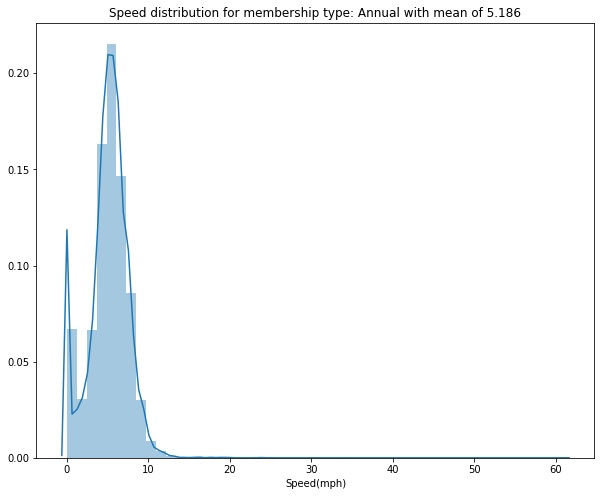

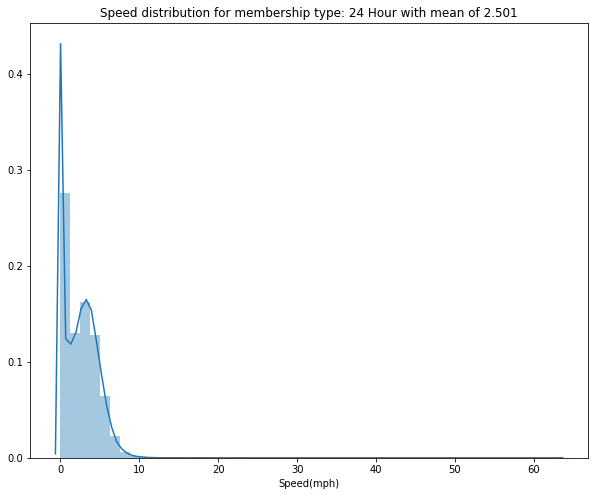

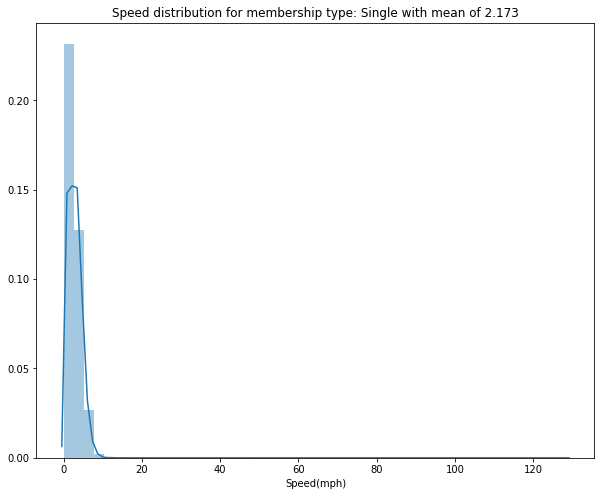

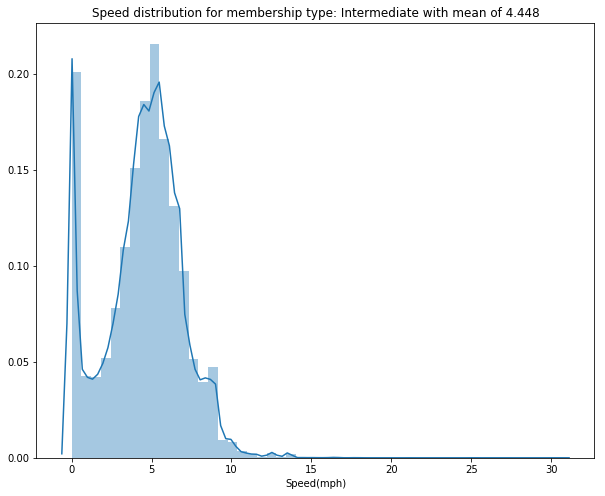

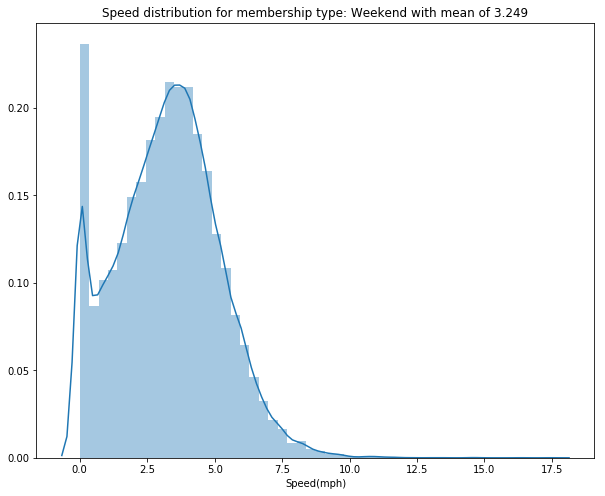

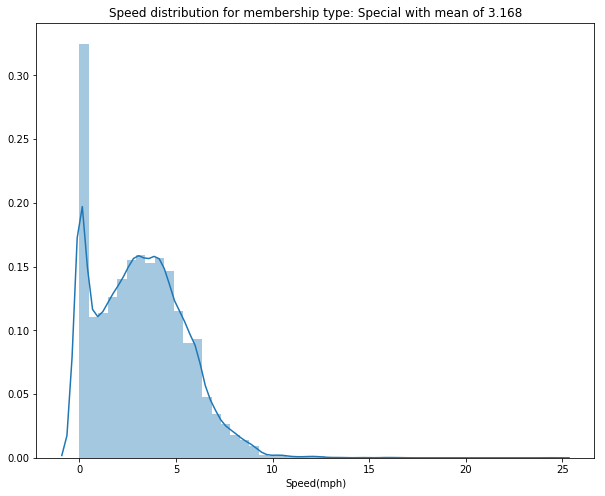

In [14]:
count = 1
for i in pdf_nonzero['Membership Type'].unique():
    temp = pdf_nonzero[pdf_nonzero['Membership Type'] == i]
    mean = temp['Speed(mph)'].mean()
    plt.figure(count, figsize=(10,8))
    sns.distplot(temp['Speed(mph)'])
    plt.title(f"Speed distribution for membership type: {i} with mean of {mean:0.3f}")
    count += 1

plt.show()

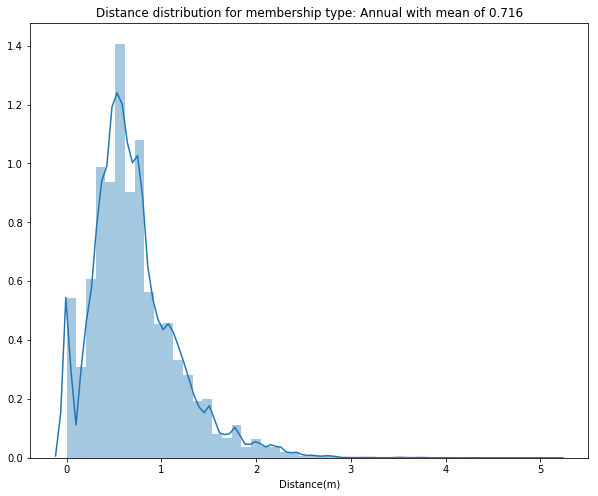

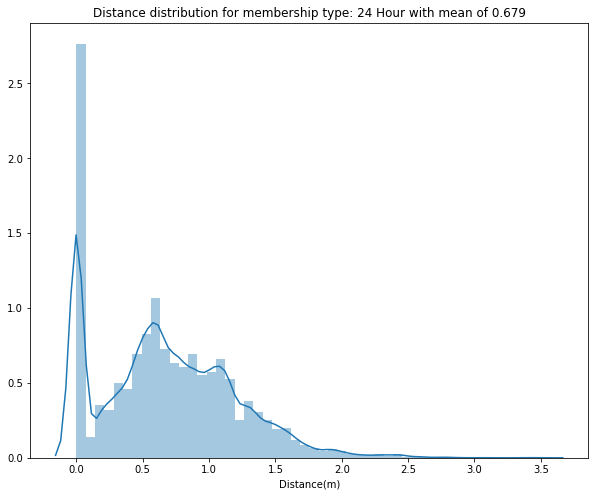

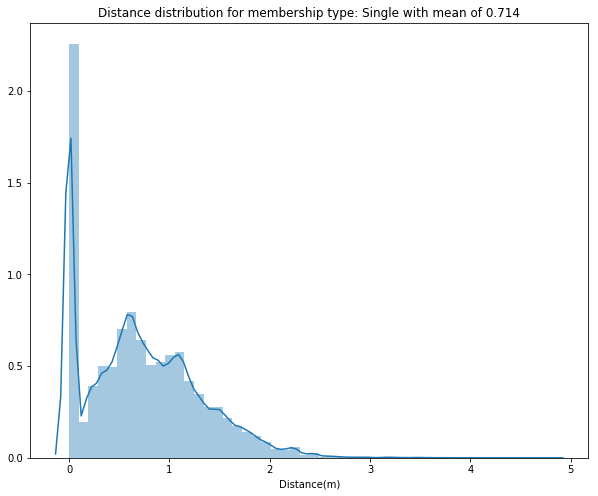

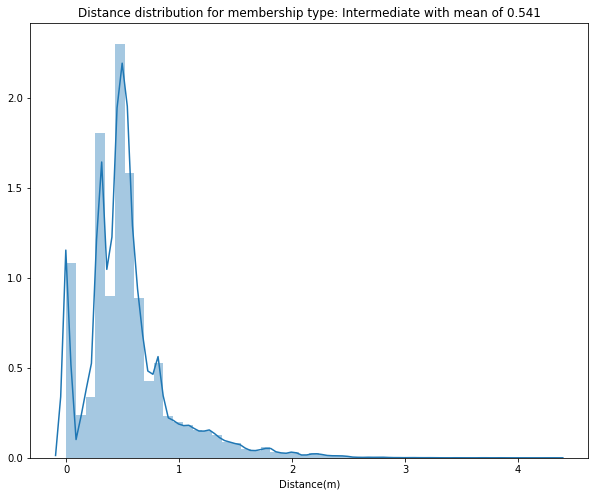

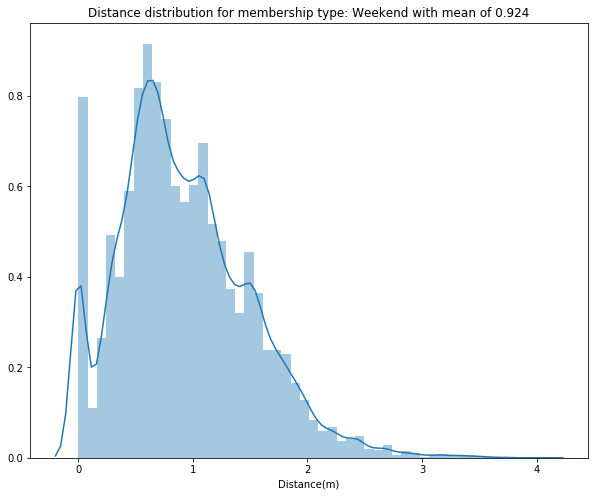

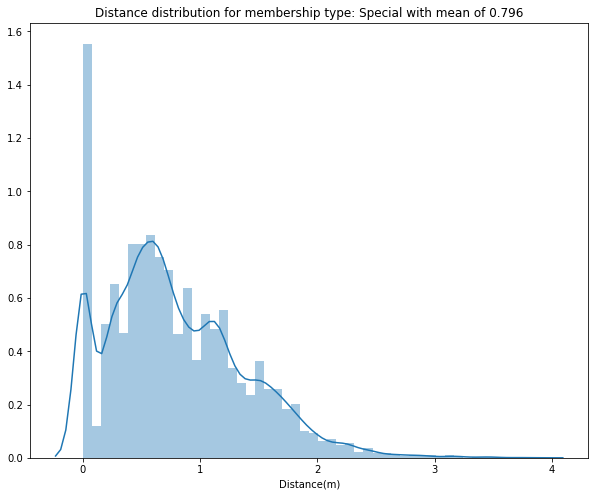

In [15]:
count = 1
for i in pdf_nonzero['Membership Type'].unique():
    temp = pdf_nonzero[pdf_nonzero['Membership Type'] == i]
    mean = temp['Distance(m)'].mean()
    plt.figure(count, figsize=(10,8))
    sns.distplot(temp['Distance(m)'])
    plt.title(f"Distance distribution for membership type: {i} with mean of {mean:0.3f}")
    count += 1

plt.show()

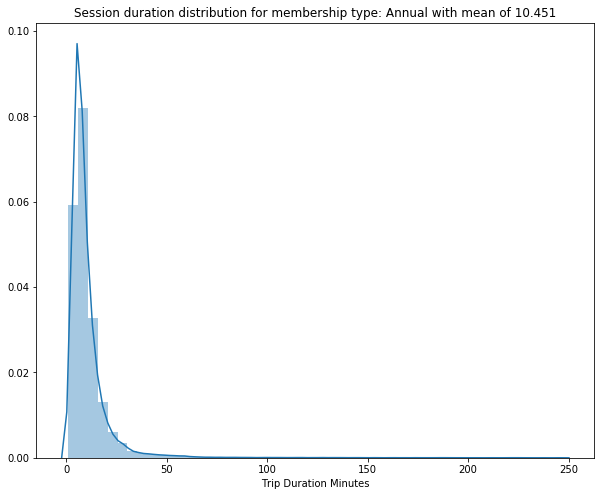

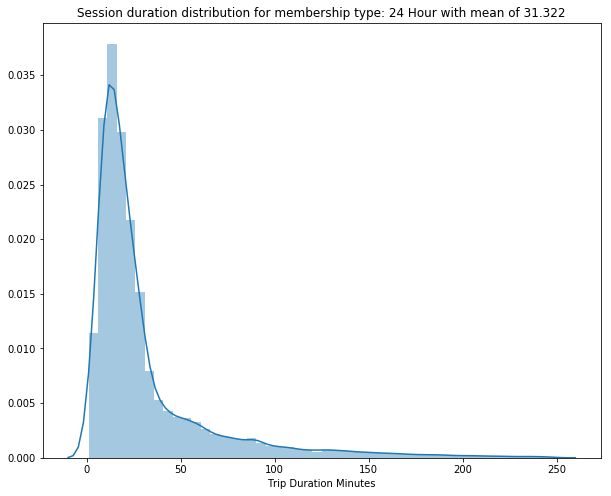

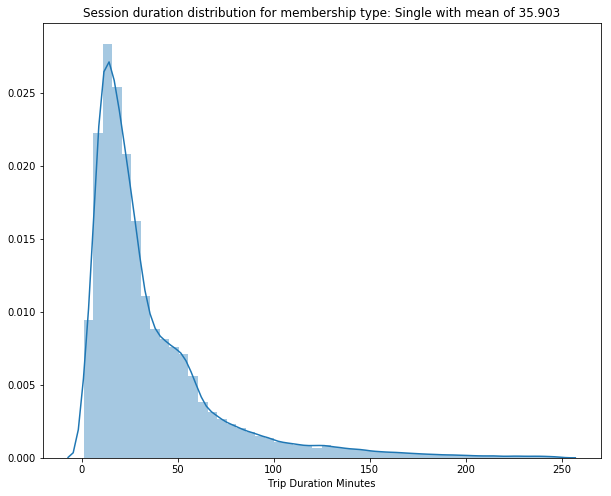

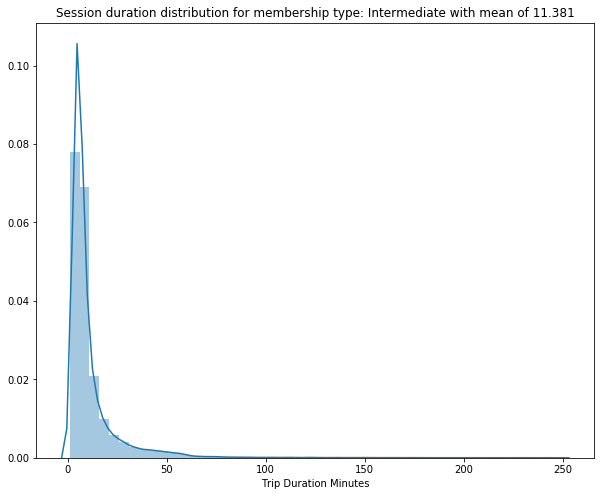

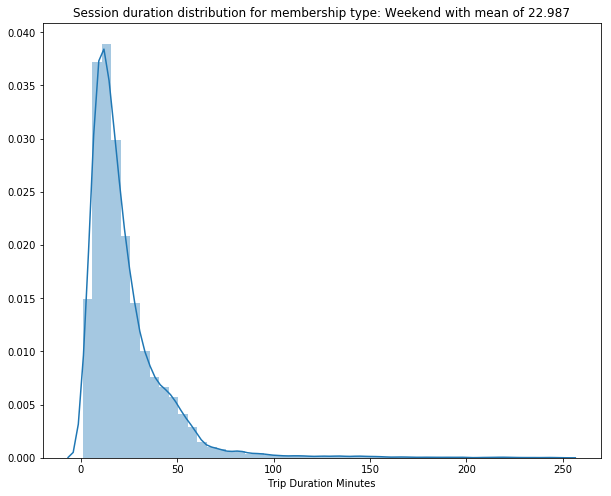

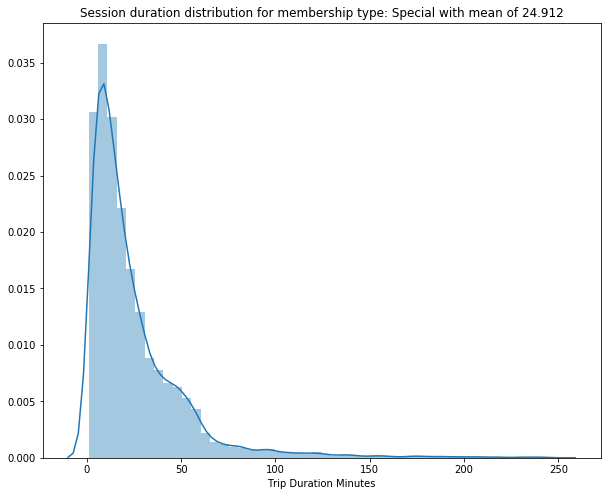

In [16]:
count = 1
for i in pdf_nonzero['Membership Type'].unique():
    temp = pdf_nonzero[pdf_nonzero['Membership Type'] == i]
    temp = temp[temp["Trip Duration Minutes"] < 250]
    mean = temp['Trip Duration Minutes'].mean()
    plt.figure(count, figsize=(10,8))
    sns.distplot(temp['Trip Duration Minutes'])
    plt.title(f"Session duration distribution for membership type: {i} with mean of {mean:0.3f}")
    count += 1

plt.show()

In [17]:
pdf_nonzero_gb = pdf_nonzero.set_index("Checkout DateTime")
hourtrends = pdf_nonzero_gb.groupby([pdf_nonzero_gb.index.dayofyear,"Checkout Kiosk ID"]).count()

In [18]:
m = folium.Map(
    location=[pdf_nonzero_gb['Checkout Latitude'].mean(),pdf_nonzero_gb['Checkout Longitude'].mean()],
    zoom_start=14,
)


# Ensure you're handing it floats
pdf_nonzero_gb['Checkout Latitude'] = pdf_nonzero_gb['Checkout Latitude'].astype(float)
pdf_nonzero_gb['Checkout Longitude'] = pdf_nonzero_gb['Checkout Longitude'].astype(float)


heat_df = pdf_nonzero_gb[pdf_nonzero_gb.index.year == 2015]
heat_df = heat_df[['Checkout Latitude', 'Checkout Longitude']]

# List comprehension to make out list of lists
heat_data = [[row['Checkout Latitude'],row['Checkout Longitude']] for index, row in heat_df.iterrows()]

# Plot it on the map
HeatMap(heat_data).add_to(m)


m

In [19]:
m = folium.Map(
    location=[pdf_nonzero_gb['Checkout Latitude'].mean(),pdf_nonzero_gb['Checkout Longitude'].mean()],
    zoom_start=14,
)


# Ensure you're handing it floats
pdf_nonzero_gb['Checkout Latitude'] = pdf_nonzero_gb['Checkout Latitude'].astype(float)
pdf_nonzero_gb['Checkout Longitude'] = pdf_nonzero_gb['Checkout Longitude'].astype(float)
pdf_nonzero_gb['Return Latitude'] = pdf_nonzero_gb['Return Latitude'].astype(float)
pdf_nonzero_gb['Return Longitude'] = pdf_nonzero_gb['Return Longitude'].astype(float)

heat_df = pdf_nonzero_gb[pdf_nonzero_gb.index.year == 2017]
heat_df = heat_df[['Checkout Latitude', 'Checkout Longitude']]

# Create weight column, using date
heat_df['Weight'] = pdf_nonzero_gb[pdf_nonzero_gb.index.year == 2017].index.dayofyear
# heat_df['Weight'] = pdf_nonzero_gb.index.day
heat_df['Weight'] = heat_df['Weight'].astype(float)


# List comprehension to make out list of lists
heat_data = [[[row['Checkout Latitude'],row['Checkout Longitude']] for index, row in heat_df[heat_df['Weight'] == i].iterrows()] for i in range(0,365)]


# Plot it on the map
hm = plugins.HeatMapWithTime(heat_data, auto_play=True
                             ,max_opacity=0.9, use_local_extrema=True
                             ,radius=25)
hm.add_to(m)

m

In [20]:
pdf_nonzero.index = pdf_nonzero['Checkout DateTime']
temp = pdf_nonzero.groupby(pdf_nonzero.index.date).count()
temp['Date'] = temp.index
dfs = temp[['Date','Trip ID']]
dfs.index = np.arange(0, len(dfs))
dfs.columns = ['ds','y']
dfs.head()

,ds,y
0,2013-12-21,101
1,2013-12-22,112
2,2013-12-23,95
3,2013-12-24,83
4,2013-12-25,141


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


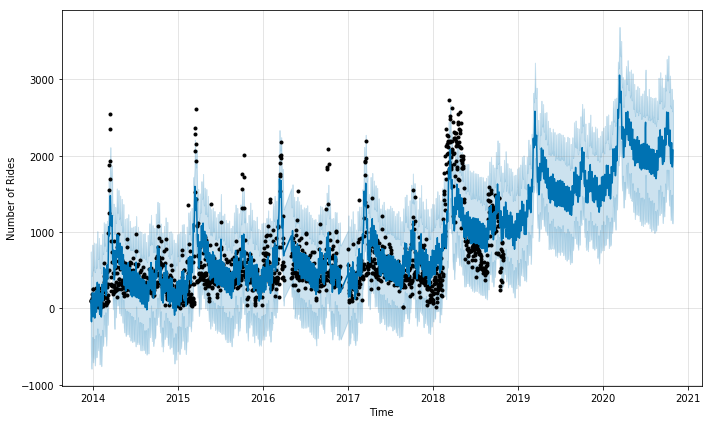

In [23]:
df = dfs.copy()
m = Prophet(growth='linear',changepoint_prior_scale=0.1
            , yearly_seasonality=15, interval_width=0.95)
m.add_country_holidays(country_name='US')
m.fit(df)
# Python
future = m.make_future_dataframe(periods=730)
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()
fig = m.plot(forecast, xlabel='Time', ylabel='Number of Rides')

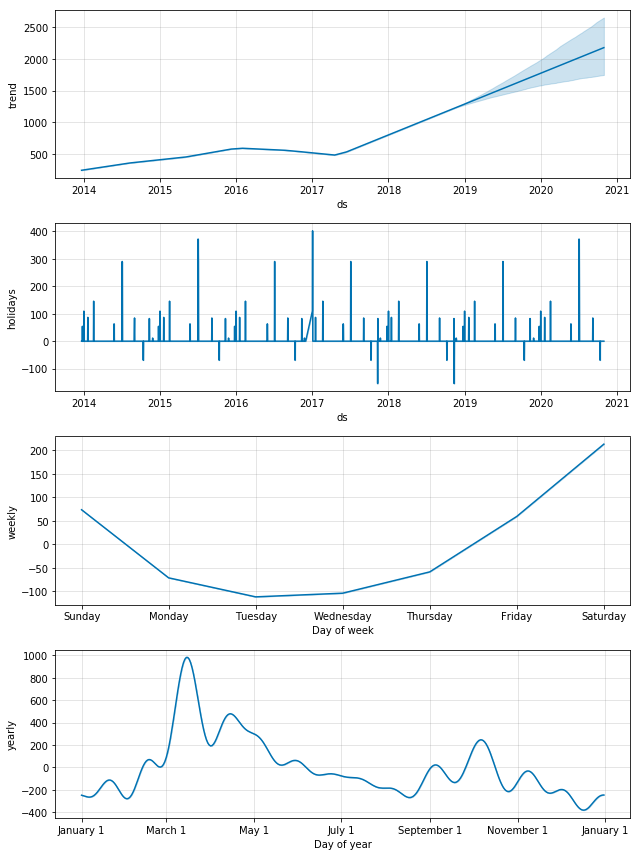

In [24]:
fig2 = m.plot_components(forecast)